In [2]:
from astropy.io import fits
from astropy.table import unique, Table, join, Column
from astropy.coordinates import Galactic, SkyCoord, ICRS, Distance
import astropy.coordinates as coord
from astropy import units as u
from astropy.time import Time
from collections import Counter
import datetime
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import matplotlib as mpl
from matplotlib import rc
from matplotlib.colors import ListedColormap
import multiprocessing as mp
import numpy as np
import os
import pandas as pd
import pickle
from scipy.stats.distributions import uniform, randint
from scipy.sparse import lil_matrix
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
from sklearn import manifold
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from sklearn.model_selection import ParameterSampler
import time
from tqdm import tqdm, tnrange, tqdm_notebook

In [3]:
import pandas as pd

df_result=pd.read_csv("Downloads/final_result_2000_200_20240722.csv")

df_result.describe()

,Unnamed: 0,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,...,phot_bp_mean_mag,phot_rp_mean_mag,l,b,phot_g_mean_mag,radial_velocity,radial_velocity_error,probability,stability,label
count,11651.000000,1.165100e+04,11651.000000,11651.000000,11651.000000,11651.000000,11651.000000,11651.000000,11651.000000,11651.000000,...,11407.000000,11419.000000,11651.000000,11651.000000,11638.000000,4294.000000,4294.000000,11651.000000,11651.000000,11651.000000
mean,8366.396361,5.979708e+18,232.190824,0.075194,-34.133953,0.053885,6.693947,0.086389,-13.010603,0.102373,...,16.851227,13.932915,333.344533,12.487461,15.177932,-3.349269,5.384665,0.542064,55.717106,17.823620
std,4871.646090,4.148925e+17,30.851729,0.092046,16.655307,0.065550,1.015208,0.103203,7.221208,0.128659,...,3.207730,2.345283,42.709369,14.184010,2.609947,34.036090,4.730070,0.333765,46.362844,12.610169
min,0.000000,1.447746e+18,123.448555,0.005560,-78.207829,0.006643,3.189445,0.008276,-39.135994,0.006795,...,2.949327,2.957041,0.007235,-19.885471,2.773012,-790.366460,0.121591,0.101266,1.000000,1.000000
25%,3832.500000,5.994795e+18,232.594707,0.025571,-41.871893,0.017904,6.281716,0.029729,-17.459656,0.033829,...,15.458243,12.848004,328.904049,5.029975,14.077751,-9.565925,2.925886,0.237624,8.000000,5.000000
50%,9041.000000,6.049142e+18,242.548463,0.045898,-26.967609,0.032771,6.761315,0.053123,-11.462529,0.061860,...,17.353022,14.194674,349.171085,16.706193,15.530044,-3.227293,4.608552,0.472222,52.000000,14.000000
75%,12814.500000,6.237348e+18,246.479701,0.085094,-23.156176,0.061223,7.144390,0.099988,-9.637579,0.115647,...,19.004161,15.425496,352.583942,20.319210,16.832579,5.733721,6.603648,0.923077,101.000000,32.000000
max,15727.000000,6.736330e+18,287.757963,1.203060,33.378390,0.898206,12.484916,1.262405,10.977484,2.099618,...,22.663279,19.319843,359.993435,89.583535,20.810911,276.830260,38.452843,1.000000,147.000000,38.000000


In [4]:
df_result['distance'] = 1/(df_result['parallax']/1000)

In [5]:
sco_cen_stars = df_result.copy()

sco_cen_stars

,Unnamed: 0,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,...,phot_rp_mean_mag,l,b,phot_g_mean_mag,radial_velocity,radial_velocity_error,probability,stability,label,distance
0,0,5969516633162555136,250.379400,0.050472,-38.845627,0.026944,5.751689,0.056863,-12.078009,0.065910,...,15.233259,344.191192,4.946514,16.525140,NaN,NaN,0.972789,147,1,173.861976
1,4,5977916871999830272,254.114332,0.160063,-34.895775,0.086639,5.469670,0.184457,-12.592050,0.234266,...,12.984853,349.156913,5.174430,14.093583,-25.206379,2.812900,0.170068,147,1,182.826402
2,5,6018121060057257472,247.295639,0.080180,-38.761235,0.057371,5.926663,0.087367,-13.369703,0.105354,...,15.789602,342.633196,6.785003,17.141792,NaN,NaN,0.408163,147,1,168.729024
3,6,6018126591976591872,247.295736,0.070320,-38.643831,0.050661,5.738679,0.081157,-12.892578,0.094273,...,15.754749,342.719463,6.865293,17.105373,NaN,NaN,0.748299,147,1,174.256131
4,9,5969567485567967360,253.743515,0.017802,-41.092919,0.011881,5.729095,0.021362,-10.952604,0.027343,...,8.503896,344.128581,1.527420,8.749709,2.055056,1.406543,0.727891,147,1,174.547641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11646,15723,6208375299387826688,233.872387,0.037337,-31.761959,0.029718,7.196078,0.038102,-19.057679,0.046140,...,14.096482,339.179395,19.326761,15.329668,-8.225787,10.386937,1.000000,1,38,138.964580
11647,15724,6208378907161351680,233.976866,0.170270,-31.595409,0.132317,6.892989,0.194616,-20.127456,0.219155,...,16.330591,339.362761,19.402375,17.761110,NaN,NaN,1.000000,1,38,145.074940
11648,15725,6000893847465533696,229.751375,0.127733,-43.005622,0.138812,6.822682,0.186013,-19.684086,0.180007,...,16.391163,329.608917,12.093424,17.802025,NaN,NaN,1.000000,1,38,146.569932
11649,15726,6203034623514237696,220.847297,0.015123,-35.144782,0.013939,7.045314,0.016346,-19.511093,0.017493,...,11.502069,327.443687,22.342805,12.321410,4.534315,1.826850,1.000000,1,38,141.938308


In [6]:
sco_cen_stars['distance']

0        173.861976
1        182.826402
2        168.729024
3        174.256131
4        174.547641
            ...    
11646    138.964580
11647    145.074940
11648    146.569932
11649    141.938308
11650    140.844950
Name: distance, Length: 11651, dtype: float64

In [7]:
c = SkyCoord(ra=np.asarray(sco_cen_stars['ra'])*u.deg, dec=np.asarray(sco_cen_stars['dec'])*u.deg, distance=np.asarray(sco_cen_stars['distance'])*u.pc, frame="icrs")

sco_cen_stars['x_pc'] = c.galactic.cartesian.x.value
sco_cen_stars['y_pc'] = c.galactic.cartesian.y.value
sco_cen_stars['z_pc'] = c.galactic.cartesian.z.value
print(sco_cen_stars)

       Unnamed: 0            source_id          ra  ra_error        dec  \
0               0  5969516633162555136  250.379400  0.050472 -38.845627   
1               4  5977916871999830272  254.114332  0.160063 -34.895775   
2               5  6018121060057257472  247.295639  0.080180 -38.761235   
3               6  6018126591976591872  247.295736  0.070320 -38.643831   
4               9  5969567485567967360  253.743515  0.017802 -41.092919   
...           ...                  ...         ...       ...        ...   
11646       15723  6208375299387826688  233.872387  0.037337 -31.761959   
11647       15724  6208378907161351680  233.976866  0.170270 -31.595409   
11648       15725  6000893847465533696  229.751375  0.127733 -43.005622   
11649       15726  6203034623514237696  220.847297  0.015123 -35.144782   
11650       15727  6206028220018318080  230.877212  0.075500 -34.729991   

       dec_error  parallax  parallax_error       pmra  pmra_error  ...  \
0       0.026944  5.75168

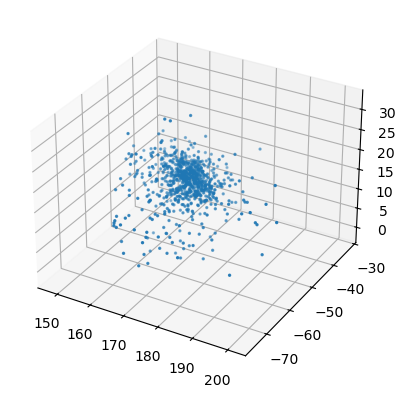

In [8]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
group1 = sco_cen_stars[(sco_cen_stars['label'] == 1)]
p = ax.scatter(group1['x_pc'], group1['y_pc'], group1['z_pc'], s=2)

In [9]:
len(sco_cen_stars)

11651

In [10]:
;pip install plotly

zsh:1: unknown file attribute: i
Note: you may need to restart the kernel to use updated packages.


In [11]:
import plotly.graph_objects as go

# Filter group1 based on the label
group1 = sco_cen_stars[sco_cen_stars['label'] == 1]

# Create the interactive 3D scatter plot
fig2 = go.Figure(data=[
    go.Scatter3d(
        x=sco_cen_stars['x_pc'],   # X-axis data
        y=sco_cen_stars['y_pc'],   # Y-axis data
        z=sco_cen_stars['z_pc'],   # Z-axis data
        mode='markers',     # Marker plot
        marker=dict(
            size=2,         # Marker size
            color=sco_cen_stars['z_pc'],  # Color based on z coordinate
            colorscale='Viridis',  # Colorscale for the markers
            opacity=0.8      # Opacity of markers
        )
    )
])

# Update layout for larger size and better visualization
fig2.update_layout(
    scene=dict(
        xaxis_title='X (pc)',
        yaxis_title='Y (pc)',
        zaxis_title='Z (pc)'
    ),
    title="Interactive 3D Scatter Plot of Stars",
    width=1200,  # Increased width
    height=800   # Increased height
)

# Show the plot
fig2.show()


In [12]:
import plotly.graph_objects as go

# Filter group1 based on the label
group1 = sco_cen_stars[sco_cen_stars['label'] == 1]

# Create the interactive 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=sco_cen_stars['x_pc'],   # X-axis data
        y=sco_cen_stars['y_pc'],   # Y-axis data
        z=sco_cen_stars['z_pc'],   # Z-axis data
        mode='markers',     # Marker plot
        marker=dict(
            size=2,         # Marker size
            color=group1['z_pc'],  # Color based on z coordinate
            colorscale='Viridis',  # Colorscale for the markers
            opacity=0.8      # Opacity of markers
        )
    )
])

# Cartesian positions
x = group1['x_pc'].values
y = group1['y_pc'].values
z = group1['z_pc'].values

# Add scatter points
fig.add_trace(go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
            size=2,         # Marker size
            color=group1['z_pc'],  # Color based on z coordinate
            colorscale='delta',  # Colorscale for the markers
            opacity=0.8      # Opacity of markers
        ),
    name='Stars'
))


# Update layout for larger size and better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X (pc)',
        yaxis_title='Y (pc)',
        zaxis_title='Z (pc)'
    ),
    title="Interactive 3D Scatter Plot of Stars",
    width=1200,  # Increased width
    height=800   # Increased height
)

# Show the plot
fig.show()


In [13]:
import plotly.graph_objects as go

# Filter group1 based on the label
group1 = sco_cen_stars[sco_cen_stars['label'] == 1]

# Create the interactive 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=group1['x_pc'],   # X-axis data
        y=group1['y_pc'],   # Y-axis data
        z=group1['z_pc'],   # Z-axis data
        mode='markers',     # Marker plot
        marker=dict(
            size=2,         # Marker size
            color=group1['z_pc'],  # Color based on z coordinate
            colorscale='Viridis',  # Colorscale for the markers
            opacity=0.8      # Opacity of markers
        )
    )
])

# Update layout for larger size and better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X (pc)',
        yaxis_title='Y (pc)',
        zaxis_title='Z (pc)'
    ),
    title="Interactive 3D Scatter Plot of Group 1 Stars",
    width=1200,  # Increased width
    height=800   # Increased height
)

# Show the plot
fig.show()


In [14]:
sco_cen_stars.columns

Index(['Unnamed: 0', 'source_id', 'ra', 'ra_error', 'dec', 'dec_error',
       'parallax', 'parallax_error', 'pmra', 'pmra_error', 'pmdec',
       'pmdec_error', 'ruwe', 'phot_bp_mean_mag', 'phot_rp_mean_mag', 'l', 'b',
       'phot_g_mean_mag', 'radial_velocity', 'radial_velocity_error',
       'probability', 'stability', 'label', 'distance', 'x_pc', 'y_pc',
       'z_pc'],
      dtype='object')

In [15]:
sco_cen_stars['label']

0         1
1         1
2         1
3         1
4         1
         ..
11646    38
11647    38
11648    38
11649    38
11650    38
Name: label, Length: 11651, dtype: int64

In [16]:
import numpy as np
import plotly.graph_objects as go

# Filter out rows with missing values for the required columns
group1 = sco_cen_stars.dropna(
    subset=['x_pc', 'y_pc', 'z_pc', 'pmra', 'pmdec', 'radial_velocity', 'distance']
)

# Extract data
distance = group1['distance'].values  # Distance in parsecs
pm_ra = group1['pmra'].values  # Proper motion in RA (mas/yr)
pm_dec = group1['pmdec'].values  # Proper motion in Dec (mas/yr)
radial_velocity = group1['radial_velocity'].values  # Radial velocity (km/s)

# Convert proper motion to tangential velocities (km/s)
tangential_velocity_ra = 4.74 * pm_ra * distance  # RA component
tangential_velocity_dec = 4.74 * pm_dec * distance  # Dec component

# Transform velocities into Cartesian components
ra = np.radians(group1['ra'].values)
dec = np.radians(group1['dec'].values)

# Cartesian velocity components
vx = -tangential_velocity_ra * np.sin(ra) - tangential_velocity_dec * np.sin(dec) * np.cos(ra) + radial_velocity * np.cos(dec) * np.cos(ra)
vy = tangential_velocity_ra * np.cos(ra) - tangential_velocity_dec * np.sin(dec) * np.sin(ra) + radial_velocity * np.cos(dec) * np.sin(ra)
vz = tangential_velocity_dec * np.cos(dec) + radial_velocity * np.sin(dec)

# Cartesian positions
x = group1['x_pc'].values
y = group1['y_pc'].values
z = group1['z_pc'].values

# Create the interactive 3D scatter plot with arrows
fig = go.Figure()

# Add scatter points
fig.add_trace(go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
            size=2,         # Marker size
            color='blue',  # Color based on z coordinate
            opacity=0.8      # Opacity of markers
        ),
    name='Stars'
))

for xi, yi, zi, vxi, vyi, vzi in zip(x, y, z, vx, vy, vz):
    fig.add_trace(go.Scatter3d(
        x=[xi, xi + vxi * 0.0005],  # Scale the arrow length for better visualization
        y=[yi, yi + vyi * 0.0005],
        z=[zi, zi + vzi * 0.0005],
        mode='lines',
        line=dict(color='red', width=1),  # Assign color dynamically
    ))

# Update layout
fig.update_layout(
    scene=dict(
        xaxis_title='X (pc)',
        yaxis_title='Y (pc)',
        zaxis_title='Z (pc)',
    ),
    title="Interactive 3D Vector Velocity Plot",
    width=1200,
    height=800
)
print(len(group1))
# Show the plot
fig.show()


4294
